# Lab 1: Independent Component Analysis

### Machine Learning 2 (2017/2018)

* The lab exercises should be made in groups of two people.
* The deadline is Thursday, April 19, 23:59.
* Assignment should be submitted through BlackBoard! Make sure to include your and your teammates' names with the submission.
* Attach the .IPYNB (IPython Notebook) file containing your code and answers. Naming of the file should be "studentid1\_studentid2\_lab#", for example, the attached file should be "12345\_12346\_lab1.ipynb". Only use underscores ("\_") to connect ids, otherwise the files cannot be parsed.

Notes on implementation:

* You should write your code and answers in an IPython Notebook: http://ipython.org/notebook.html. If you have problems, please ask.
* Use __one cell__ for code and markdown answers only!
    * Put all code in the cell with the ```# YOUR CODE HERE``` comment and overwrite the ```raise NotImplementedError()``` line.
    * For theoretical questions, put your solution using LaTeX style formatting in the YOUR ANSWER HERE cell.
* Among the first lines of your notebook should be "%pylab inline". This imports all required modules, and your plots will appear inline.
* Large parts of you notebook will be graded automatically. Therefore it is important that your notebook can be run completely without errors and within a reasonable time limit. To test your notebook before submission, select Kernel -> Restart \& Run All.

### Literature
In this assignment, we will implement the Independent Component Analysis algorithm as described in chapter 34 of David MacKay's book "Information Theory, Inference, and Learning Algorithms", which is freely available here:
http://www.inference.phy.cam.ac.uk/mackay/itila/book.html

Read the ICA chapter carefuly before you continue!

### Notation

$\mathbf{X}$ is the $M \times T$ data matrix, containing $M$ measurements at $T$ time steps.

$\mathbf{S}$ is the $S \times T$ source matrix, containing $S$ source signal values at $T$ time steps. We will assume $S = M$.

$\mathbf{A}$ is the mixing matrix. We have $\mathbf{X} = \mathbf{A S}$.

$\mathbf{W}$ is the matrix we aim to learn. It is the inverse of $\mathbf{A}$, up to indeterminacies (scaling and permutation of sources).

$\phi$ is an elementwise non-linearity or activation function, typically applied to elements of $\mathbf{W X}$.

### Code
In the following assignments, you can make use of the signal generators listed below.



In [1]:
%pylab inline
import sys
assert sys.version_info[:3] >= (3, 6, 0), "Make sure you have Python 3.6 installed"

# Signal generators
def sawtooth(x, period=0.2, amp=1.0, phase=0.):
    return (((x / period - phase - 0.5) % 1) - 0.5) * 2 * amp

def sine_wave(x, period=0.2, amp=1.0, phase=0.):
    return np.sin((x / period - phase) * 2 * np.pi) * amp

def square_wave(x, period=0.2, amp=1.0, phase=0.):
    return ((np.floor(2 * x / period - 2 * phase - 1) % 2 == 0).astype(float) - 0.5) * 2 * amp

def triangle_wave(x, period=0.2, amp=1.0, phase=0.):
    return (sawtooth(x, period, 1., phase) * square_wave(x, period, 1., phase) + 0.5) * 2 * amp

def random_nonsingular_matrix(d=2):
    """
    Generates a random nonsingular (invertible) matrix of shape d*d
    """
    epsilon = 0.1
    A = np.random.rand(d, d)
    while abs(np.linalg.det(A)) < epsilon:
        A = np.random.rand(d, d)
    return A

def plot_signals(X, title="Signals"):
    """
    Plot the signals contained in the rows of X.
    """
    figure()
    
    for i in range(X.shape[0]):
        ax = plt.subplot(X.shape[0], 1, i + 1)
        plot(X[i, :])
        ax.set_xticks([])
        ax.set_yticks([])
    plt.suptitle(title)

Populating the interactive namespace from numpy and matplotlib


The following code generates some toy data to work with.

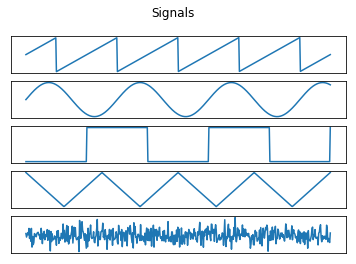

In [2]:
# Generate data
num_sources = 5
signal_length = 500
t = linspace(0, 1, signal_length)
S = np.c_[sawtooth(t), sine_wave(t, 0.3), square_wave(t, 0.4), triangle_wave(t, 0.25), np.random.randn(t.size)].T
plot_signals(S)

### 1.1 Make mixtures (5 points)
Write a function `make_mixtures(S, A)' that takes a matrix of source signals $\mathbf{S}$ and a mixing matrix $\mathbf{A}$, and generates mixed signals $\mathbf{X}$.

In [3]:
### 1.1 Make mixtures
def make_mixtures(S, A):
    return A @ S

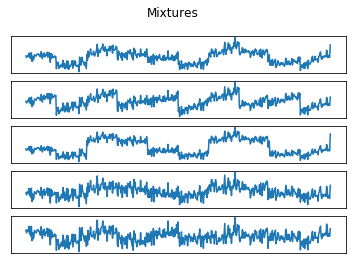

In [4]:
### Test your function
np.random.seed(42)
A = random_nonsingular_matrix(d=S.shape[0])
X = make_mixtures(S, A)
plot_signals(X, "Mixtures")

assert X.shape == (num_sources, signal_length), "The shape of your mixed signals is incorrect"


### 1.2 Histogram (5 points)
Write a function `plot_histograms(X)` that takes a data-matrix $\mathbf{X}$ and plots one histogram for each signal (row) in $\mathbf{X}$. You can use the `np.histogram()` (followed by `plot`) or `plt.hist()` function. 

Plot histograms of the sources and the measurements.

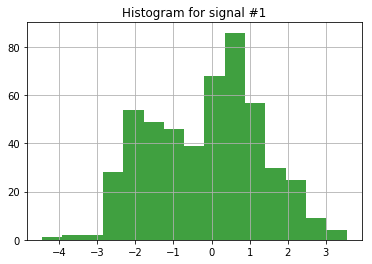

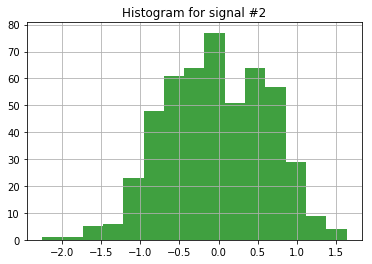

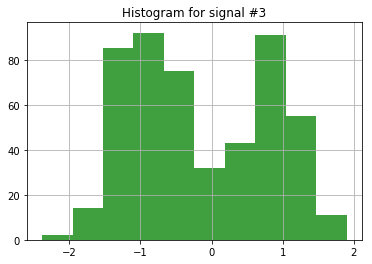

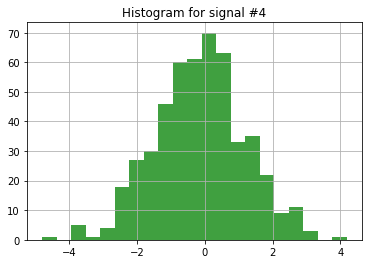

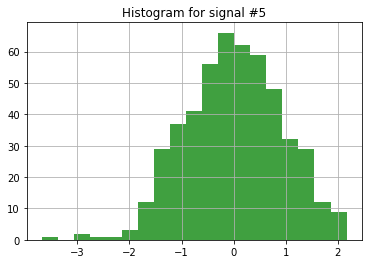

In [45]:
### 1.2 Histogram

def plot_histogram(X):
    for signal in range(X.shape[0]):
        hist, bin_edges = np.histogram(X[signal])
        plt.title("Histogram for signal #{}".format(signal+1))
        plt.hist(X[signal], bins="auto", facecolor='green', alpha=0.75)
        plt.grid(True)
        plt.show()

plot_histogram(X)

Which of these distributions (sources or measurements) tend to look more like Gaussians? Can you think of an explanation for this phenomenon? Why is this important for ICA?

In our case, the distributions for signals 2, 4 and 5 tend to look like Gaussians. For 2 and 4, this can be explained by their symmetry and continuity. For 5, the noisy signal, it can be assumed that the distribution of signal strengths roughly follows a Gaussian distribution. 

This is important for ICA because there are infinite solutions for the original sources if the mixed signals are gaussian. "The Gaussian distribution on the latent variables is invariant under rotation of the latent variables, so there can be no evidence favouring any particular alignment of the latent variable space. The linear algorithm [...] will never recover [...] the original sources. Thankfully, most real source have non-Gaussian distributions." ("Information Theory, Inference, and Learning Algorithms", MacKay,  Cambridge University Press 2003, p. 349)

### 1.3 Implicit priors (20 points)
As explained in MacKay's book, an activation function $\phi$ used in the ICA learning algorithm corresponds to a prior distribution over sources. Specifically, $\phi(a) = \frac{d}{da} \ln p(a)$. For each of the following activation functions, *derive* the source distribution they correspond to.
$$\phi_0(a) = -\tanh(a)$$
$$\phi_1(a) = -a + \tanh(a)$$
$$\phi_2(a) = -a^3$$
$$\phi_3(a) = -\frac{6a}{a^2 + 5}$$

Give your answer without the normalizing constant, so an answer of the form $p(a) \propto \verb+[answer]+$ is ok.

$\phi_0(a) = -\tanh(a)$

$\frac{\partial}{\partial a}\ln p_0(a) = - \tanh(a)$

$p_0(a) = \exp(\int (-\tanh(a))da) = \exp(-\ln(\cosh(a) + C)) = \frac{1}{\cosh(a)}+C'$

$p_0(a) \propto \frac{1}{\cosh(a)}$

------

$\phi_1(a) = -a + \tanh(a)$

$p_1(a) = \exp(-\frac{1}{2}a^2 +\ln(\cosh(a))+ C)$

$p_1(a) \propto \exp(-\frac{1}{2}a^2) + \cosh(a)$

------

$\phi_2(a) = -a^3$

$p_2(a) \propto \exp(-\frac{1}{4}a^4)$

------

$\phi_3(a) = -\frac{6a}{a^2 + 5}$

$p_3(a) \propto (a^2 + 5)^{-3}$



In [129]:
def phi_0(a):
    return -np.tanh(a)

def p_0(a):
    return 1 / np.cosh(a)

In [130]:
def phi_1(a):
    return -a + np.tanh(a)

def p_1(a):
    return np.exp(-1/2 * a**2) + np.cosh(a)

In [131]:
numpy.seterr(over='ignore')
import sys

def phi_2(a):
    res = []
    
    for i, el in enumerate(a):
        #try:
        #    r =  -el**3
        #except FloatingPointError:
        #    # In case of integer overflow
        #    r = -sys.maxsize - 1
        r =  -el**3
        res.append(r)
            
    return np.array(res)

def p_2(a):
    return np.exp(-1/4*a**4)

In [132]:
def phi_3(a):
    res = -6*a / (a**2 + 5)
    return res

def p_3(a):
    return (a**2 + 5)**(-3)

In [133]:
activation_functions = [phi_0, phi_1, phi_2, phi_3]
priors = [p_0, p_1, p_2, p_3]

a = np.linspace(-5, 5, 1000)
for prior in priors:
    assert prior(a).shape == (1000, ), "Wrong output shape"


Plot the activation functions and the corresponding prior distributions, from $a = -5$ to $5$ (hint: use the lists defined in the cell above). Compare the shape of the priors to the histogram you plotted in the last question.

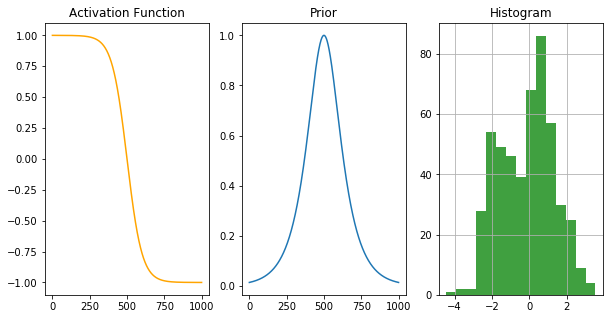

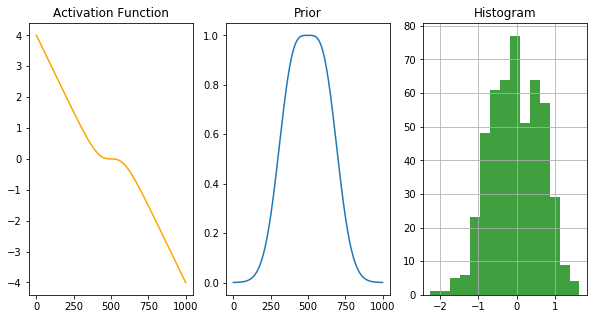

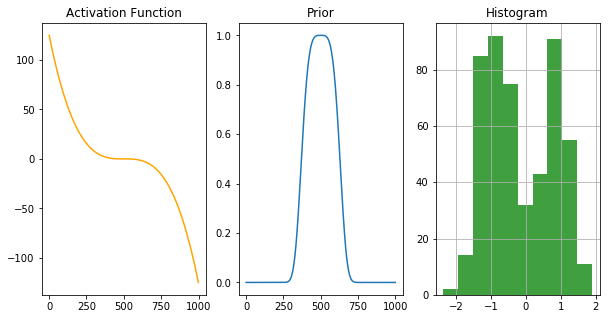

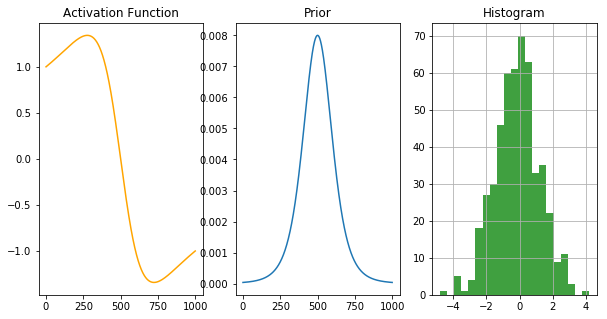

In [62]:
### 1.3 Implicit priors (continued)
a = np.linspace(-5, 5, 1000)

for signal, (phi, prior) in enumerate(zip(activation_functions, priors)):
    figure(figsize=(10, 5))
    subplot(131)
    plt.plot(phi(a), color="orange")
    plt.title("Activation Function")
    subplot(132)
    plt.plot(prior(a))
    plt.title("Prior")
    subplot(133)
    plt.hist(X[signal], bins="auto", facecolor='green', alpha=0.75)
    plt.grid(True)
    plt.title("Histogram")
    plt.show()

### 1.4 Whitening (15 points)
Some ICA algorithms can only learn from whitened data. Write a method `whiten(X)` that takes a $M \times T$ data matrix $\mathbf{X}$ (where $M$ is the dimensionality and $T$ the number of examples) and returns a whitened matrix. If you forgot what whitening is or how to compute it, various good sources are available online, such as http://courses.media.mit.edu/2010fall/mas622j/whiten.pdf. Your function should also center the data before whitening.

In [135]:
### 1.4 Whitening
def whiten(X):
    # Center data
    Xc = X - np.mean(X)
    
    # Decorrelate
    Sigma = numpy.cov(Xc)  # Get covariance matrix
    Kappa, Phi = numpy.linalg.eig(Sigma)  # Get eigenvectors and -values
    
    Xd = np.zeros(Xc.shape)
    for i in range(Xc.shape[1]):
        Xd[:,i] = Phi.T @ Xc[:,i]
    
    # Check
    assert is_diagonal(numpy.cov(Xd))
    
    # Whiten
    Xw = np.zeros(Xd.shape)
    for i in range(Xd.shape[1]):
        Xw[:,i] = np.diag(Kappa**(-1/2)) @ Xd[:,i]
        
    # Check
    assert is_diagonal(numpy.cov(Xw))
    assert is_uniform(numpy.cov(Xw))
    
    return Xw

def is_diagonal(matrix, tolerance=1e-5):
    """ Check if a matrix is diagonal by checking if all entries outside the diagonal are below a tolerance value. """
    too_big = np.where(matrix - np.diag(np.diagonal(matrix)) > tolerance)
    return len(too_big[0]) == 0

def is_uniform(matrix):
    """ Check if every value on the matrix' diagonal is uniform. """
    diagonal = np.diagonal(matrix)
    checks = np.where(np.isclose(diagonal, np.sum(diagonal) / len(diagonal)))
    return len(checks[0]) == len(diagonal)

In [136]:
### Test your function
Xw = whiten(X)
assert Xw.shape == (num_sources, signal_length), "The shape of your mixed signals is incorrect"


### 1.5 Interpret results of whitening (10 points)
Make 3 figures, one for the sources, one for measurements and one for the whitened measurements. In each figure, make $5 \times 5$ subplots with scatter plots for each pair of signals. Each axis represents a signal and each time-instance is plotted as a dot in this space. You can use the `plt.scatter()` function. Describe what you see.

Now compute and visualize the covariance matrix of the sources, the measurements and the whitened measurements. You can visualize each covariance matrix using this code:
```python
# Dummy covariance matrix C;
C = np.eye(5)  
ax = imshow(C, cmap='gray', interpolation='nearest')
```

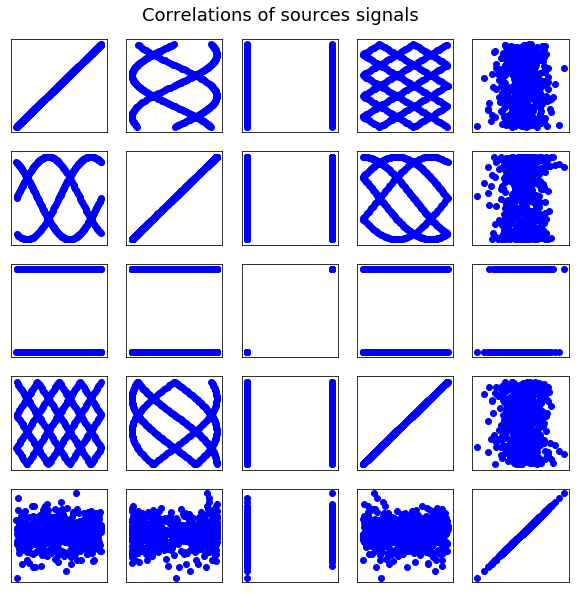

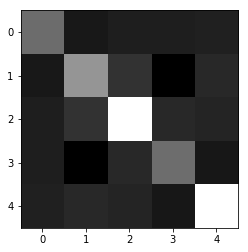

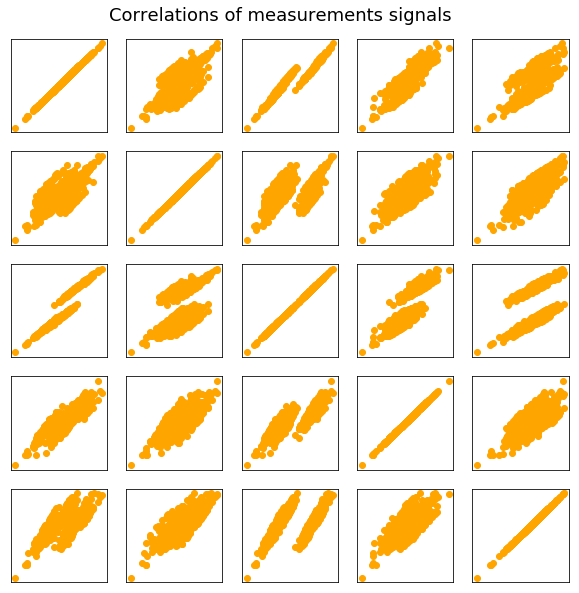

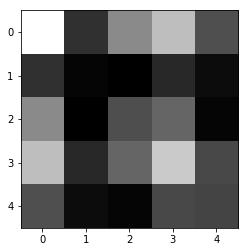

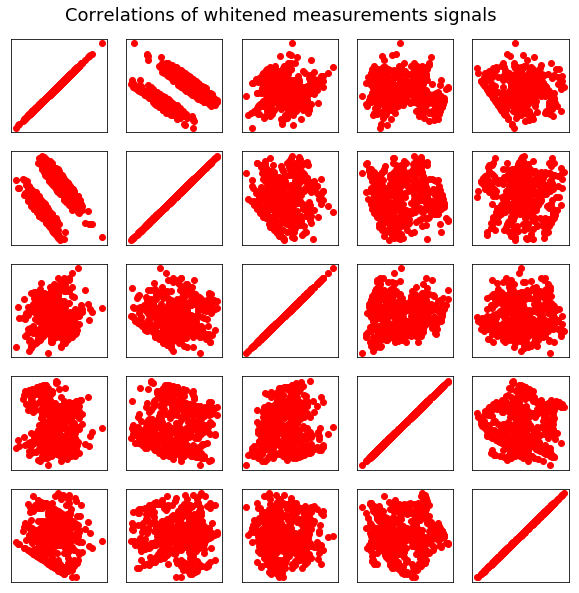

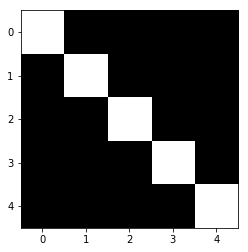

In [65]:
### 1.5 Interpret results of whitening

# Sources S
# Mixtures X
# Whitened data Xw
to_plot = {"Sources": (S, "blue"), "Measurements": (X, "orange"), "Whitened Measurements": (Xw, "red")}

for title, (data, pltcolor) in to_plot.items():
    # Plot correlations
    figure(figsize=(10, 10))
    plt.suptitle("Correlations of {} signals".format(title.lower()), y=0.925, fontsize=18)
    
    num_signals = data.shape[0]
    for i in range(num_signals):
        for j in range(num_signals):
            ax = plt.subplot(num_signals, num_signals, i+1 + j*num_signals)
            ax.set_xticks([])
            ax.set_yticks([])
            ax.scatter(data[i], data[j], color=pltcolor)
    plt.show()
    
    C = np.cov(data)
    ax = imshow(C, cmap='gray', interpolation='nearest')


Are the signals independent after whitening?

The following things can be observed from the scatter plots:
* Naturally, all signals correlate with themselves
* No signal correlates with the noise except for the noise itself
* Some correlation can be observed for some raw signal pairs, indicated by the woven-like patterns
* After mixing, all the signals show some degree of correlation, as it can be observed by the diagonal orientation of the plots. THis makes intuitive sense, as all signals now contain parts of each other signal.
* After the whitening, the signals are indpendent, as they have been decorrelated.

### 1.6 Covariance (5 points)
Explain what a covariant algorithm is. 

A covariant algorithm is an algorithm that "should give the same results independent of the units in which quantities are measured" (Knuth, 1968), i.e. that is dimensionally consistent inasmuch that it isn't affected by the rescaling of certain parameters.

### 1.7 Independent Component Analysis (25 points)
Implement the covariant ICA algorithm as described in MacKay. Write a function `ICA(X, activation_function, learning_rate)`, that returns the demixing matrix $\mathbf{W}$. The input `activation_function` should accept a function such as `lambda a: -tanh(a)`. Update the gradient in batch mode, averaging the gradients over the whole dataset for each update. Make it efficient, so use matrix operations instead of loops where possible (loops are slow in interpreted languages such as python and matlab, whereas matrix operations are internally computed using fast C code). Experiment with the learning rate and the initialization of $\mathbf{W}$. Your algorithm should be able to converge (i.e. `np.linalg.norm(grad) < 1e-5`) in within 10000 steps.

In [138]:
### 1.7 Independent Component Analysis
def ICA(X, activation_function, learning_rate=None, threshold=1e-5, max_iterations=100000, verbose=True):
    # Custom learning rates for activation function unless a learning_rate is explicitly stated
    learning_rates = {
        "phi_0": 0.3, "phi_1": 0.1, "phi_2": 0.01, "phi_3": 0.3
    }
    if learning_rate is None:
        learning_rate = learning_rates[activation_function.__name__]
    
    if verbose:
        print("\n\nStarting ICA with {} and learning rate of {}.".format(activation_function.__name__, learning_rate))
    num_signals = X.shape[0]
    data_size = X.shape[1]
    W = np.random.rand(num_signals, num_signals)
    gradW = np.zeros((num_signals, num_signals))
    norm = np.inf
    iteration = 0
    
    while norm > threshold and iteration < max_iterations:
        A = W @ X
        Z = activation_function(A)
        Xprime = W.T @ A
        gradW = W + (Z @ Xprime.T)
        gradW = gradW / data_size  # batch normalization
        norm = np.linalg.norm(gradW)
        W = W + (learning_rate * gradW)
        
        if verbose:
            print(
                "\rIteration #{} | Gradient norm: {:.6f} | {}{}".format(
                    iteration + 1, norm,
                    "Not converged" if norm > threshold else "Converged",
                    " "*30
                ), 
                flush=True, end=""
            )
        iteration += 1
        
    return W

In [139]:
# We will test your function so make sure it runs with only X and phi as input, and returns only W
# Also it should converge for all activation functions

W_estimates = [ICA(Xw, activation_function=phi) for phi in activation_functions]
assert all([W_est.shape == (num_sources, num_sources) for W_est in W_estimates])




Starting ICA with phi_0 and learning rate of 0.3.
Iteration #2816 | Gradient norm: 0.000010 | Converged                                  

Starting ICA with phi_1 and learning rate of 0.1.
Iteration #100000 | Gradient norm: 0.000011 | Not converged                              

Starting ICA with phi_2 and learning rate of 0.01.
Iteration #100000 | Gradient norm: 0.000079 | Not converged                              

Starting ICA with phi_3 and learning rate of 0.3.
Iteration #2414 | Gradient norm: 0.000010 | Converged                                  

### 1.8 Experiments  (5 points)
Run ICA on the provided signals using each activation function $\phi_0, \ldots, \phi_3$ (or reuse `W_estimates`). Use the found demixing matrix $\mathbf{W}$ to reconstruct the signals and plot the retreived signals for each choice of activation function.

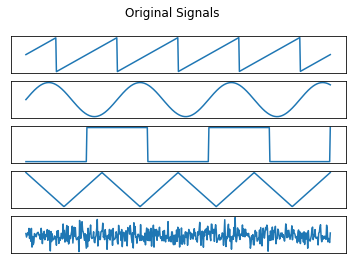

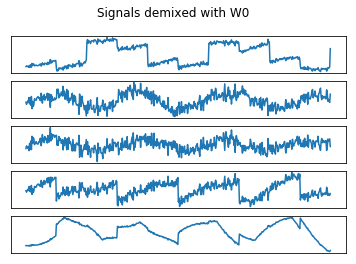

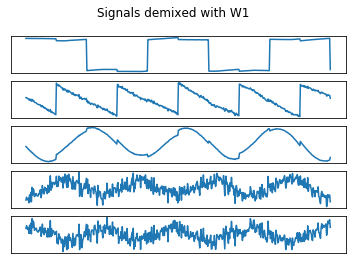

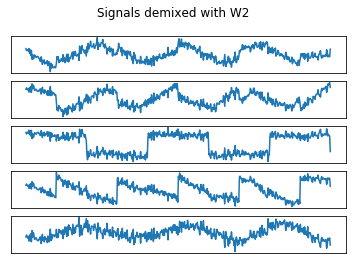

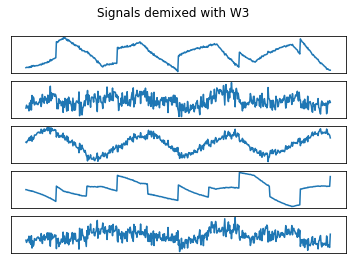

In [140]:
# 1.8 Experiments

plot_signals(S, title="Original Signals")
for i, W_estimate in enumerate(W_estimates):
    demixed_signals = W_estimate @ Xw
    plot_signals(demixed_signals, title="Signals demixed with W{}".format(i))

In [154]:
import time
from collections import defaultdict

def does_whitening_make_a_difference():
    # Does it make a difference (in terms of speed of convergence) 
    # if you whiten your data before running ICA?
    times = defaultdict(list)
    n=3
    threshold=1e-4
    
    # Return True or False
    for name, data in zip(["Default", "Whitened"], [X, Xw]):
        for activation_function in activation_functions:
            for i in range(n):
                print("\rRun {} for {}-{}".format(i+1, name, activation_function.__name__), end="", flush=True)
                times[name].append(time_run(data, activation_function))
                
    avg_default = np.average(times["Default"])
    avg_whitened = np.average(times["Whitened"])
    print("Averages default: {:.4f} | Average whitened: {:.4f}".format(avg_default, avg_whitened))
    res = abs(avg_whitened - avg_default) > threshold and avg_whitened < avg_default
    return bool(res)
            

def time_run(data, activation_function):
    start = time.time()
    ICA(Xw, activation_function=activation_function, verbose=False)
    end = time.time()
    
    return end - start

In [155]:
assert type(does_whitening_make_a_difference()) == bool

Run 3 for Whitened-phi_3Averages default: 3.9922 | Average whitened: 3.9799
<class 'numpy.bool_'>


AssertionError: 

### 1.9 Audio demixing (10 points)
The 'cocktail party effect' refers to the ability humans have to attend to one speaker in a noisy room. We will now use ICA to solve a similar but somewhat idealized version of this problem. The code below loads 5 sound files and plots them.

Use a random non-singular mixing matrix to mix the 5 sound files. You can listen to the results in your browser using `play_signals`, or save them to disk if this does not work for you. Plot histograms of the mixed audio and use your ICA implementation to de-mix these and reproduce the original source signals. As in the previous exercise, try each of the activation functions.

Keep in mind that this problem is easier than the real cocktail party problem, because in real life there are often more sources than measurements (we have only two ears!), and the number of sources is unknown and variable. Also, mixing is not instantaneous in real life, because the sound from one source arrives at each ear at a different point in time. If you have time left, you can think of ways to deal with these issues.

In [144]:
import scipy.io.wavfile
from IPython.display import Audio, display, Markdown

# Save mixtures to disk, so you can listen to them in your audio player
def save_wav(data, out_file, rate):
    scaled = np.int16(data / np.max(np.abs(data)) * 32767)
    scipy.io.wavfile.write(out_file, rate, scaled)

# Or play them in your browser
def play_signals(S, sample_rate, title="Signals"):
    display(Markdown(title))
    for signal in S:
        display(Audio(signal, rate=sample_rate))

Signals

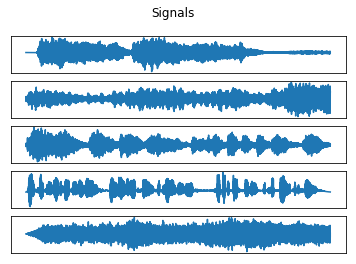

In [145]:
# Load audio sources
source_files = ['beet.wav', 'beet9.wav', 'beet92.wav', 'mike.wav', 'street.wav']
wav_data = []
sample_rate = None
for f in source_files:
    sr, data = scipy.io.wavfile.read(f, mmap=False)
    if sample_rate is None:
        sample_rate = sr
    else:
        assert(sample_rate == sr)
    wav_data.append(data[:190000])  # cut off the last part so that all signals have same length

# Create source and measurement data
S_audio = np.c_[wav_data]
plot_signals(S_audio)
play_signals(S_audio, sample_rate)

In [146]:
### 1.9 Audio demixing

# Mix signals
mixing_matrix = random_nonsingular_matrix(d=5)
X_audio = make_mixtures(S_audio, mixing_matrix)
Xw_audio = whiten(X_audio)

W_estimates_audio = [ICA(Xw_audio, activation_function=phi) for phi in activation_functions]



Starting ICA with phi_0 and learning rate of 0.3.
Iteration #5972 | Gradient norm: 0.000010 | Converged                                  

Starting ICA with phi_1 and learning rate of 0.1.
Iteration #43246 | Gradient norm: 0.000010 | Converged                                  

Starting ICA with phi_2 and learning rate of 0.01.
Iteration #100000 | Gradient norm: 0.000048 | Not converged                              

Starting ICA with phi_3 and learning rate of 0.3.
Iteration #5556 | Gradient norm: 0.000010 | Converged                                  

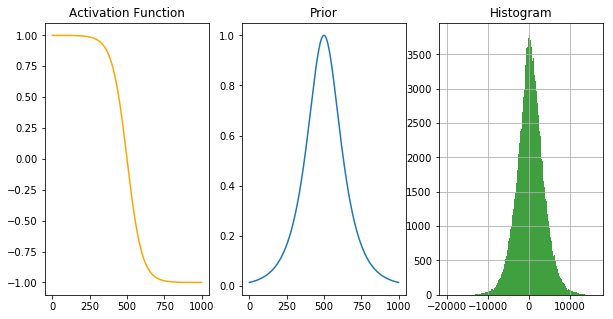

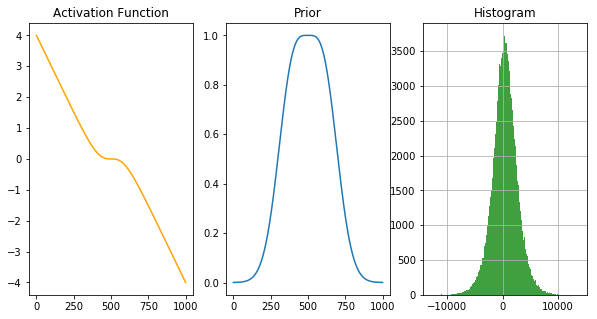

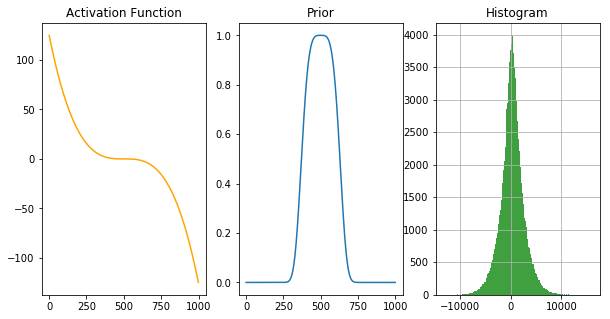

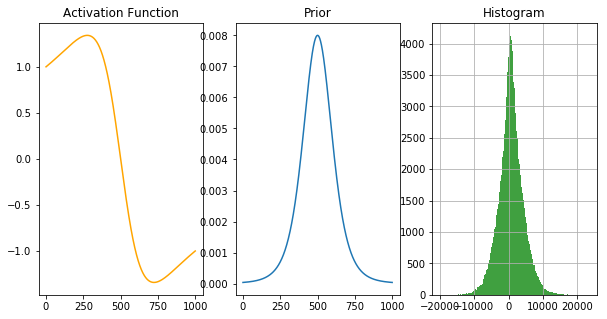

In [66]:
for signal, (phi, prior) in enumerate(zip(activation_functions, priors)):
    figure(figsize=(10, 5))
    subplot(131)
    plt.plot(phi(a), color="orange")
    plt.title("Activation Function")
    subplot(132)
    plt.plot(prior(a))
    plt.title("Prior")
    subplot(133)
    plt.hist(X_audio[signal], bins="auto", facecolor='green', alpha=0.75)
    plt.grid(True)
    plt.title("Histogram")
    plt.show()

Signals

Signals

Signals

Signals

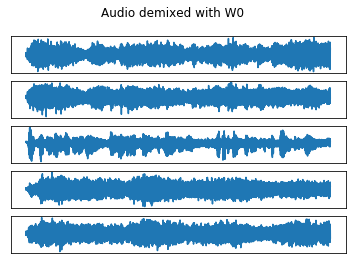

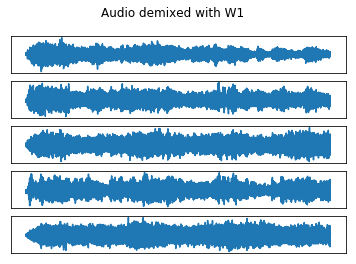

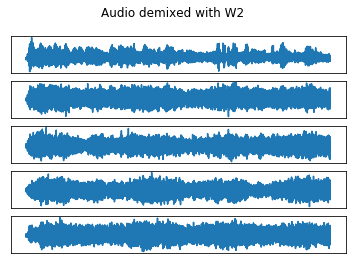

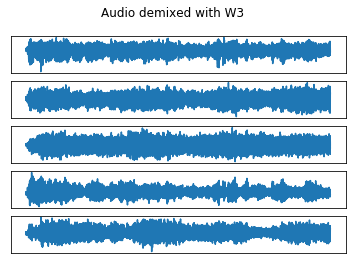

In [148]:
for i, W_estimate in enumerate(W_estimates_audio):
    demixed_signals = W_estimate @ Xw_audio
    plot_signals(demixed_signals, title="Audio demixed with W{}".format(i))
    play_signals(demixed_signals, sample_rate)

Report your results. Using which activation functions ICA recovers the sources?

Phi_0 seems to produce the best results.

### 1.10 Excess Kurtosis (15 points)
The (excess) kurtosis is a measure of 'peakedness' of a distribution. It is defined as
$$
\verb+Kurt+[X] = \frac{\mu_4}{\sigma^4} - 3 = \frac{\operatorname{E}[(X-{\mu})^4]}{(\operatorname{E}[(X-{\mu})^2])^2} - 3
$$
Here, $\mu_4$ is known as the fourth moment about the mean, and $\sigma$ is the standard deviation.
The '-3' term is introduced so that a Gaussian random variable has 0 excess kurtosis.
We will now try to understand the performance of the various activation functions by considering the kurtosis of the corresponding priors, and comparing those to the empirical kurtosis of our data.

#### 1.10.1 (10 points)
First, compute analytically the kurtosis of the four priors that you derived from the activation functions before. You may find it helpful to use an online service such as [Wolfram Alpha](https://www.wolframalpha.com/) or [Integral Calculator](https://www.integral-calculator.com/) to (help you) evaluate the required integrals. Give your answer as both an exact expression as well as a numerical approximation (for example $\frac{\pi}{2} \approx 1.571$).

1) $\phi_0(a) = -tanh(a)$ $$ p_0(a) = exp\Bigg(\int -tanh(a) da \Bigg) = exp(-log(cosh(a))+c) = \frac{k}{cosh(a)}$$

Since, $\int_{-\infty}^\infty p(a) da = 1$, $$ \int_{-\infty}^\infty \frac{k}{cosh(a)} da = 2k(tan^{-1}(tanh(\infty)) - tan^{-1}(tanh(-\infty))) = 2k(\pi/4 - (-\pi/4)) = 1 $$ $$ \implies k = 1/\pi$$ Hence, $p(a) = \frac{1}{\pi cosh(a)}$

Now the mean of the pdf can be calculated as, $$ \mu = \int_{-\infty}^\infty a p(a) da = \int_{-\infty}^\infty \frac{a}{\pi cosh(a)} da = 0 $$ Therefore, the kurtosis formula can be rewritten as, $Kurt[p_0(a)] = \frac{\mu_4}{(\sigma^2)^2} - 3 = \frac{E[X^4]}{(E[X^2])^2} - 3$

Therefore, $$ \mu_4 = \int_{-\infty}^\infty a^4 p(a) da = \int_{-\infty}^\infty \frac{a^4}{\pi cosh(a)} da = \frac{5 \pi^4}{16} = 30.44 $$

Similarly, $$ \sigma^2 = \int_{-\infty}^\infty a^2 p(a) da = \int_{-\infty}^\infty \frac{a^2}{\pi cosh(a)} da = \frac{\pi^2}{4} = 2.4674 $$

Therefore, Kurtosis is $$ Kurt[p_0(a)] = \frac{\mu_4}{(\sigma^2)^2} - 3 = \frac{5 \pi^4 / 16}{(\pi^2/4)^2} - 3 = 5-3 = 2 $$

------

2) $\phi_0(a) = -a + tanh(a)$ $$ p_0(a) = exp\Bigg(\int -a + tanh(a) da \Bigg) = exp(-\frac{a^2}{2}+log(cosh(a))+c) = k\ exp(-\frac{a^2}{2})cosh(a)$$

Since, $\int_{-\infty}^\infty p(a) da = 1$, $$ \int_{-\infty}^\infty k\ exp(-\frac{a^2}{2})cosh(a) da = k\sqrt{2e\pi} = 1 $$ $$ \implies k = 1/\sqrt{2e\pi}$$ Hence, $p(a) = \frac{exp(-\frac{a^2}{2})cosh(a)}{\sqrt{2e\pi}}$

Now the mean of the pdf can be calculated as, $$ \mu = \int_{-\infty}^\infty a p(a) da = \int_{-\infty}^\infty k\ exp(-\frac{a^2}{2})cosh(a) da = 0 $$ Therefore, the kurtosis formula can be rewritten as, $Kurt[p_0(a)] = \frac{\mu_4}{(\sigma^2)^2} - 3 = \frac{E[X^4]}{(E[X^2])^2} - 3$

Therefore, $$ \mu_4 = \int_{-\infty}^\infty a^4 p(a) da = \int_{-\infty}^\infty a^4 k\ exp(-\frac{a^2}{2})cosh(a) da = k(2^3\sqrt{2e\pi}+2\sqrt{2e\pi}) = 10 $$

Similarly, $$ \sigma^2 = \int_{-\infty}^\infty a^2 p(a) da = \int_{-\infty}^\infty a^2 k\ exp(-\frac{a^2}{2})cosh(a) da = 2k \sqrt{2e\pi} = 2 $$

Therefore, Kurtosis is $$ Kurt[p_0(a)] = \frac{\mu_4}{(\sigma^2)^2} - 3 = \frac{10}{(2)^2} - 3 = \frac{10}{4}-3 = -0.5 $$

------

3) $\phi_2(a) = -a^3$ Hence, $$p_2(a) = exp\bigg(\int -a^3 da \bigg) = exp(-\frac{a^3}{4}+k)$$

Since, $\int_{-\infty}^\infty p(a) d(a) = 1$, $$ \int_{-\infty}^\infty exp(-\frac{a^3}{4}+k) da = \frac{e^k\Gamma(1/4)}{\sqrt{2}} = 1 $$ $$ \implies e^k = \frac{\sqrt{2}}{\Gamma(1/4)} $$

Hence, $p_2(a) = \frac{\sqrt{2}}{\Gamma(1/4)} exp(-\frac{a^3}{4})$

Now the mean of the pdf can be calculated as, $$ \mu = \int_{-\infty}^\infty a p(a) da = \int_{-\infty}^\infty a\ exp(-\frac{a^3}{4}+k) da = 0 $$ Therefore, the kurtosis formula can be rewritten as, $Kurt[p_0(a)] = \frac{\mu_4}{(\sigma^2)^2} - 3 = \frac{E[X^4]}{(E[X^2])^2} - 3$

Therefore, $$ \mu_4 = \int_{-\infty}^\infty a^4 p(a) da = \int_{-\infty}^\infty a^4 exp(-\frac{a^3}{4}+k) da = exp(k)\frac{\Gamma(1/4)}{\sqrt{2}} = \frac{\sqrt{2}}{\Gamma(1/4)} \frac{\Gamma(1/4)}{\sqrt{2}} = 1 $$

Similarly, $$ \sigma^2 = \int_{-\infty}^\infty a^2 p(a) da = \int_{-\infty}^\infty a^2 exp(-\frac{a^3}{4}+k) da = \sqrt{2} e^k \Gamma(3/4) = 2 \frac{\Gamma(3/4)}{\Gamma(1/4)} = 0.676 $$

Therefore, Kurtosis is $$ Kurt[p_0(a)] = \frac{\mu_4}{(\sigma^2)^2} - 3 = \frac{1}{\bigg( 2 \frac{\Gamma(3/4)}{\Gamma(1/4)} \bigg)^2} - 3= \big(\frac{\Gamma(1/4)}{2 \Gamma(3/4)}\big)^2 - 3 = -0.8117 $$

------

4) $\phi_3(a) = -\frac{6a}{a^2 + 5}$ $$p_3(a) = exp(\int -\frac{6a}{a^2 + 5} da) = exp(-3 \ln(a^2 + 5) + C) = exp(\ln(a^2+5)^{-3}k) = k(a^2+5)^{-3} $$

Since $\int_{-\infty}^\infty p(a) d(a) = 1$, $$ \int_{-\infty}^\infty k(a^2+5)^{-3} da = \frac{3\pi k}{200\sqrt{5}} = 1 $$ $$ \implies k = \frac{200 \sqrt{5}}{3\pi} $$

Hence, $p_3(a) = \frac{200\sqrt{5}}{3\pi(a^2+5)^3}$

Now the mean of the pdf can be calculated as, $$ \mu = \int_{-\infty}^\infty a p(a) da = \int_{-\infty}^\infty a\ \frac{200\sqrt(5)}{3\pi(a^2+5)^3} da = 0 $$ Therefore, the kurtosis formula can be rewritten as, $Kurt[p_0(a)] = \frac{\mu_4}{(\sigma^2)^2} - 3 = \frac{E[X^4]}{(E[X^2])^2} - 3$

Therefore, $$ \mu_4 = \int_{-\infty}^\infty a^4 p(a) da = \int_{-\infty}^\infty a^4 \frac{200\sqrt(5)}{3\pi(a^2+5)^3} da = \frac{200 \sqrt{5}}{3\pi} \frac{3 \pi}{8\sqrt{5}} = 25 $$

Similarly, $$ \sigma^2 = \int_{-\infty}^\infty a^2 p(a) da = \int_{-\infty}^\infty a^2 \frac{200\sqrt(5)}{3\pi(a^2+5)^3} da = \frac{200 \sqrt{5}}{3\pi} \frac{\pi}{40\sqrt{5}} = \frac{5}{3} $$

Therefore, Kurtosis is $$ Kurt[p_0(a)] = \frac{\mu_4}{(\sigma^2)^2} - 3 = \frac{25}{(\frac{5}{3})^2} - 3 = 9-3 = 6 $$


In [165]:
### Include your answer here (you can use math.gamma if needed)
def get_kurtosis():
    # Return a list with 4 numbers / expressions
    return [2, -0.5, -0.8117, 6]    

In [166]:
# Let's check
kurtosis = get_kurtosis()
print (kurtosis)
assert len(kurtosis) == 4


[2, -0.5, -0.8117, 6]


#### 1.10.2 (5 points)
Now use the `scipy.stats.kurtosis` function, with the `fisher` option set to `True`, to compute the empirical kurtosis of the dummy signals and the real audio signals.

Can you use this data to explain the performance of the various activation functions on the synthetic and real data?

In [162]:
### 1.10.2 Excess Kurtosis
from scipy.stats import kurtosis

# Dummy signals
for i, signal in enumerate(S):
    print("Kurtosis for dummy signal #{} is {:.2f}".format(i+1, scipy.stats.kurtosis(signal, fisher=True)))

print("")
# Audio signals
for i, signal in enumerate(S_audio):
    print("Kurtosis for audio signal #{} is {:.2f}".format(i+1, scipy.stats.kurtosis(signal, fisher=True)))

Kurtosis for dummy signal #1 is -1.20
Kurtosis for dummy signal #2 is -1.48
Kurtosis for dummy signal #3 is -1.84
Kurtosis for dummy signal #4 is -1.20
Kurtosis for dummy signal #5 is 0.05

Kurtosis for audio signal #1 is 1.79
Kurtosis for audio signal #2 is 2.07
Kurtosis for audio signal #3 is 1.94
Kurtosis for audio signal #4 is 5.05
Kurtosis for audio signal #5 is 0.54


YOUR ANSWER HERE